# Import libraries

In [2]:
!pip install swifter


[notice] A new release of pip is available: 23.0 -> 23.0.1
[notice] To update, run: pip install --upgrade pip


In [3]:
!pip install shap


[notice] A new release of pip is available: 23.0 -> 23.0.1
[notice] To update, run: pip install --upgrade pip


In [4]:
import sys
import os
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display
%matplotlib inline

import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
py.init_notebook_mode(connected=True)

import plotly.io as pio
pio.templates.default = "simple_white" #setting default template

import warnings
warnings.filterwarnings('ignore')

from pandas import set_option
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler, MinMaxScaler, QuantileTransformer, RobustScaler
from sklearn.model_selection import train_test_split, KFold, StratifiedKFold, cross_val_score, GridSearchCV
from sklearn.feature_selection import RFECV, SelectFromModel, SelectKBest, f_classif
from sklearn.metrics import classification_report, confusion_matrix, balanced_accuracy_score, ConfusionMatrixDisplay, f1_score
from sklearn.pipeline import Pipeline
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, VotingClassifier
from scipy.stats import uniform

#from imblearn.over_sampling import ADASYN

import swifter

# Always good to set a seed for reproducibility
SEED = 8
np.random.seed(SEED)

# Import dataset

In [5]:
columns = ['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
 'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points', 'Wilderness_Area_0', 'Wilderness_Area_1', 'Wilderness_Area_2',
 'Wilderness_Area_3', 'Soil_Type_0', 'Soil_Type_1', 'Soil_Type_2', 'Soil_Type_3', 'Soil_Type_4', 'Soil_Type_5', 'Soil_Type_6', 'Soil_Type_7', 'Soil_Type_8',
 'Soil_Type_9', 'Soil_Type_10', 'Soil_Type_11', 'Soil_Type_12', 'Soil_Type_13', 'Soil_Type_14', 'Soil_Type_15', 'Soil_Type_16', 'Soil_Type_17', 'Soil_Type_18',
 'Soil_Type_19', 'Soil_Type_20', 'Soil_Type_21', 'Soil_Type_22', 'Soil_Type_23', 'Soil_Type_24', 'Soil_Type_25', 'Soil_Type_26', 'Soil_Type_27', 'Soil_Type_28',
 'Soil_Type_29', 'Soil_Type_30', 'Soil_Type_31', 'Soil_Type_32', 'Soil_Type_33', 'Soil_Type_34', 'Soil_Type_35', 'Soil_Type_36', 'Soil_Type_37', 'Soil_Type_38',
 'Soil_Type_39']   

In [6]:
from sklearn import datasets
def sklearn_to_df(sklearn_dataset):
    df = pd.DataFrame(sklearn_dataset.data, columns=columns)
    df['target'] = pd.Series(sklearn_dataset.target)
    return df

df = sklearn_to_df(datasets.fetch_covtype())
df_name=df.columns
df.head(3)

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type_31,Soil_Type_32,Soil_Type_33,Soil_Type_34,Soil_Type_35,Soil_Type_36,Soil_Type_37,Soil_Type_38,Soil_Type_39,target
0,2596.0,51.0,3.0,258.0,0.0,510.0,221.0,232.0,148.0,6279.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
1,2590.0,56.0,2.0,212.0,-6.0,390.0,220.0,235.0,151.0,6225.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
2,2804.0,139.0,9.0,268.0,65.0,3180.0,234.0,238.0,135.0,6121.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2


In [22]:
df.describe()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type_31,Soil_Type_32,Soil_Type_33,Soil_Type_34,Soil_Type_35,Soil_Type_36,Soil_Type_37,Soil_Type_38,Soil_Type_39,target
count,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,...,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000
mean,2959.365301,155.656807,14.103704,269.428217,46.418855,2350.146611,212.146049,223.318716,142.528263,1980.291226,...,0.090392,0.077716,0.002773,0.003255,0.000205,0.000513,0.026803,0.023762,0.015060,2.051471
std,279.984734,111.913721,7.488242,212.549356,58.295232,1559.254870,26.769889,19.768697,38.274529,1324.195210,...,0.286743,0.267725,0.052584,0.056957,0.014310,0.022641,0.161508,0.152307,0.121791,1.396504
min,1859.000000,0.000000,0.000000,0.000000,-173.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2809.000000,58.000000,9.000000,108.000000,7.000000,1106.000000,198.000000,213.000000,119.000000,1024.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,2996.000000,127.000000,13.000000,218.000000,30.000000,1997.000000,218.000000,226.000000,143.000000,1710.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,3163.000000,260.000000,18.000000,384.000000,69.000000,3328.000000,231.000000,237.000000,168.000000,2550.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
max,3858.000000,360.000000,66.000000,1397.000000,601.000000,7117.000000,254.000000,254.000000,254.000000,7173.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000


In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 581012 entries, 0 to 581011
Data columns (total 55 columns):
 #   Column                              Non-Null Count   Dtype  
---  ------                              --------------   -----  
 0   Elevation                           581012 non-null  float64
 1   Aspect                              581012 non-null  float64
 2   Slope                               581012 non-null  float64
 3   Horizontal_Distance_To_Hydrology    581012 non-null  float64
 4   Vertical_Distance_To_Hydrology      581012 non-null  float64
 5   Horizontal_Distance_To_Roadways     581012 non-null  float64
 6   Hillshade_9am                       581012 non-null  float64
 7   Hillshade_Noon                      581012 non-null  float64
 8   Hillshade_3pm                       581012 non-null  float64
 9   Horizontal_Distance_To_Fire_Points  581012 non-null  float64
 10  Wilderness_Area_0                   581012 non-null  float64
 11  Wilderness_Area_1         

In [6]:
df.target.value_counts()

2    283301
1    211840
3     35754
7     20510
6     17367
5      9493
4      2747
Name: target, dtype: int64

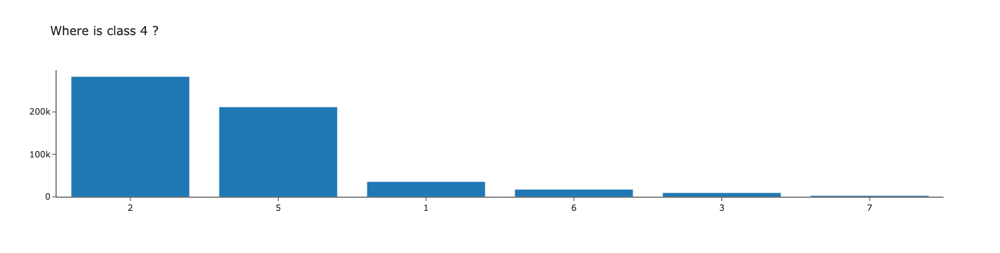

In [7]:
def BarChart(df, featureName):
    labels = [str(df[featureName].unique()[i]) for i in range(df[featureName].nunique())]
    values = [df[featureName].value_counts()[i] for i in range(1,7)] #adjust according to number of classes in category

    trace=go.Bar(x=labels,y=values)
    layout = go.Layout(title="Where is class 4 ?")                   
    fig = go.Figure(data = trace, layout = layout)
    fig.update_layout(template='simple_white',  xaxis={'categoryorder':'total descending'})
    fig.show()
    
    
BarChart(df, 'target')

<div class="alert alert-block alert-info">
<b>Data Set Characteristics:</b> 

The samples in this dataset correspond to 30×30m patches of forest in the US, collected for the task of predicting each patch’s cover type, i.e. the dominant species of tree. There are seven covertypes, making this a multiclass classification problem. Each sample has 54 features, described on the dataset’s homepage. Some of the features are boolean indicators, while others are discrete or continuous measurements.    
    
Number of Instances:
581 012

Number of Features:
54 features

Attribute Information:

**Name / Data Type / Measurement / Description**

* Elevation / quantitative /meters / Elevation in meters
* Aspect / quantitative / azimuth / Aspect in degrees azimuth
* Slope / quantitative / degrees / Slope in degrees
* Horizontal_Distance_To_Hydrology / quantitative / meters / Horz Dist to nearest surface water features
* Vertical_Distance_To_Hydrology / quantitative / meters / Vert Dist to nearest surface water features
* Horizontal_Distance_To_Roadways / quantitative / meters / Horz Dist to nearest roadway
* Hillshade_9am / quantitative / 0 to 255 index / Hillshade index at 9am, summer solstice
* Hillshade_Noon / quantitative / 0 to 255 index / Hillshade index at noon, summer soltice
* Hillshade_3pm / quantitative / 0 to 255 index / Hillshade index at 3pm, summer solstice
* Horizontal_Distance_To_Fire_Points / quantitative / meters / Horz Dist to nearest wildfire ignition points
* Wilderness_Area (4 binary columns) / qualitative / 0 (absence) or 1 (presence) / Wilderness area designation
* Soil_Type (40 binary columns) / qualitative / 0 (absence) or 1 (presence) / Soil Type designation


Number of classes:
* Cover_Type (7 types) / integer / 1 to 7 / Forest Cover Type designation
    
</div>

# Split our dataset into a train and test set

In [8]:
# here we are first separating our df into features (X) and target (y)
X =  df[df_name[0:54]]
Y = df[df_name[54]]

# now we are separating into training (80%) and test (20%) sets. The test set won't be seen until we want to test our top model!
X_train, X_test, y_train, y_test =train_test_split(X,Y,
                                                   train_size = 40_000,
                                                   test_size=10_000,
                                                   random_state=8,
                                                   stratify=df['target']) # we stratify to ensure similar distribution in train/test

# Feature engineering

Feature engineering requires knowledge about the subject. Because I'm not a forestry expert, I consulted the following resources:

https://www.kaggle.com/code/skillsmuggler/forest-cover-feature-engineering-and-reduction/notebook#Feature-reduction

https://www.kaggle.com/code/codename007/forest-cover-type-eda-baseline-model/notebook

https://www.kaggle.com/code/kwabenantim/forest-cover-feature-engineering#Adding-new-features

https://shankarmsy.github.io/posts/forest-cover-types.html

In [9]:
# engineering new columns from df
def FeatureEngineering(X):
    
    X['Aspect'] = X['Aspect'] % 360
    X['Aspect_120'] = (X['Aspect'] + 120) % 360


    X['Hydro_Elevation_sum'] = X['Elevation'] + X['Vertical_Distance_To_Hydrology']
                                 
    
    X['Hydro_Elevation_diff'] = abs(X['Elevation'] - X['Vertical_Distance_To_Hydrology'])

    X['Hydro_Euclidean'] = np.sqrt(X['Horizontal_Distance_To_Hydrology']**2 +
                                   X['Vertical_Distance_To_Hydrology']**2)

    X['Hydro_Manhattan'] = abs(X['Horizontal_Distance_To_Hydrology'] +
                            X['Vertical_Distance_To_Hydrology'])
    
    X['Hydro_Distance_sum'] = X['Horizontal_Distance_To_Hydrology'] + X['Vertical_Distance_To_Hydrology']
                                
    X['Hydro_Distance_diff'] = abs(X['Horizontal_Distance_To_Hydrology'] - X['Vertical_Distance_To_Hydrology'])
    
    X['Hydro_Fire_sum'] = X['Horizontal_Distance_To_Hydrology'] + X['Horizontal_Distance_To_Fire_Points']
                            
    X['Hydro_Fire_diff'] = abs(X['Horizontal_Distance_To_Hydrology'] + X['Horizontal_Distance_To_Fire_Points'])

    X['Hydro_Fire_mean'] = (X['Horizontal_Distance_To_Hydrology'] + X['Horizontal_Distance_To_Fire_Points'])/2
                               
    X['Hydro_Road_sum'] = X['Horizontal_Distance_To_Hydrology'] + X['Horizontal_Distance_To_Roadways']
                            
    X['Hydro_Road_diff'] = abs(X['Horizontal_Distance_To_Hydrology'] + X['Horizontal_Distance_To_Roadways'])

    X['Hydro_Road_mean'] = (X['Horizontal_Distance_To_Hydrology'] + X['Horizontal_Distance_To_Roadways'])/2
    
    X['Road_Fire_sum'] = X['Horizontal_Distance_To_Roadways'] + X['Horizontal_Distance_To_Fire_Points']
                           
    X['Road_Fire_diff'] = abs(X['Horizontal_Distance_To_Roadways'] - X['Horizontal_Distance_To_Fire_Points'])

    X['Road_Fire_mean'] = (X['Horizontal_Distance_To_Roadways'] + X['Horizontal_Distance_To_Fire_Points'])/2
    
    X['Hydro_Road_Fire_mean'] = (X['Horizontal_Distance_To_Hydrology'] + X['Horizontal_Distance_To_Roadways'] + 
                                  X['Horizontal_Distance_To_Fire_Points'])/3

    
    
    return X

In [10]:
X_train = X_train.swifter.apply(FeatureEngineering, axis = 1) 
X_test = X_test.swifter.apply(FeatureEngineering, axis = 1) 

In [13]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40000 entries, 60826 to 74573
Data columns (total 71 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Elevation                           40000 non-null  float64
 1   Aspect                              40000 non-null  float64
 2   Slope                               40000 non-null  float64
 3   Horizontal_Distance_To_Hydrology    40000 non-null  float64
 4   Vertical_Distance_To_Hydrology      40000 non-null  float64
 5   Horizontal_Distance_To_Roadways     40000 non-null  float64
 6   Hillshade_9am                       40000 non-null  float64
 7   Hillshade_Noon                      40000 non-null  float64
 8   Hillshade_3pm                       40000 non-null  float64
 9   Horizontal_Distance_To_Fire_Points  40000 non-null  float64
 10  Wilderness_Area_0                   40000 non-null  float64
 11  Wilderness_Area_1                   4

In [42]:
#X_train.to_pickle('X_train.pkl')
#X_test.to_pickle('X_test.pkl')

X_train = pd.read_pickle('X_train.pkl')
X_test = pd.read_pickle('X_test.pkl')

# Feature selection

In [39]:
selector = SelectKBest(f_classif, k=15)
selector.fit(X_train, y_train)
mask = selector.get_support()
X_train_reduced_cols = X_train.columns[mask]

In [41]:
X_train_reduced_cols

Index(['Elevation', 'Wilderness_Area_3', 'Soil_Type_2', 'Soil_Type_3',
       'Soil_Type_9', 'Soil_Type_37', 'Soil_Type_38', 'Hydro_Elevation_sum',
       'Hydro_Elevation_diff', 'Hydro_Road_sum', 'Hydro_Road_diff',
       'Hydro_Road_mean', 'Road_Fire_sum', 'Road_Fire_mean',
       'Hydro_Road_Fire_mean'],
      dtype='object')

In [11]:
X_train_reduced = X_train[['Elevation', 'Wilderness_Area_3', 'Soil_Type_2', 'Soil_Type_3',
       'Soil_Type_9', 'Soil_Type_37', 'Soil_Type_38', 'Hydro_Elevation_sum',
       'Hydro_Elevation_diff', 'Hydro_Road_sum', 'Hydro_Road_diff',
       'Hydro_Road_mean', 'Road_Fire_sum', 'Road_Fire_mean',
       'Hydro_Road_Fire_mean']] 

In [12]:
X_test_reduced = X_test[['Elevation', 'Wilderness_Area_3', 'Soil_Type_2', 'Soil_Type_3',
       'Soil_Type_9', 'Soil_Type_37', 'Soil_Type_38', 'Hydro_Elevation_sum',
       'Hydro_Elevation_diff', 'Hydro_Road_sum', 'Hydro_Road_diff',
       'Hydro_Road_mean', 'Road_Fire_sum', 'Road_Fire_mean',
       'Hydro_Road_Fire_mean']] 

# Get the models to be used

In [17]:
# baseline models
def GetBaseModels():
    baseModels = []
    baseModels.append(('KNN'  , KNeighborsClassifier()))
    #baseModels.append(('SVM'  , SVC(probability=True)))
    baseModels.append(('RF'   , RandomForestClassifier()))
    baseModels.append(('ET'   , ExtraTreesClassifier()))
    
       
    return baseModels

# Evaluate models on untouched data (unscaled, no outlier check)

In [13]:
def ModelEvaluation(X_train, y_train,models):
    # Test options and evaluation metric
    num_folds = 10
    scoring = "f1_weighted" #This is suitable for for imbalanced classes 
    

    results = []
    names = []
    for name, model in models:
        kfold = StratifiedKFold(n_splits=num_folds, random_state=SEED, shuffle = True)
        cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring, n_jobs = -1)
        results.append(cv_results)
        names.append(name)
        msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
        print(msg)
        
    return names, results

## Plot results

In [27]:
class PlotBox(object):
    
    
    def __Trace(self,nameOfFeature,value): 
    
        trace = go.Box(
            y=value,
            name = nameOfFeature,
            marker = dict(
                color = 'rgb(0, 128, 128)', 
            )
                
        )
        
        return trace

    def PlotResult(self,names,results):
        
        data = []

        for i in range(len(names)):
            data.append(self.__Trace(names[i],results[i]))

        
        py.iplot(data)

KNN: 0.787874 (0.005053)
RF: 0.858476 (0.004277)
ET: 0.868786 (0.003100)


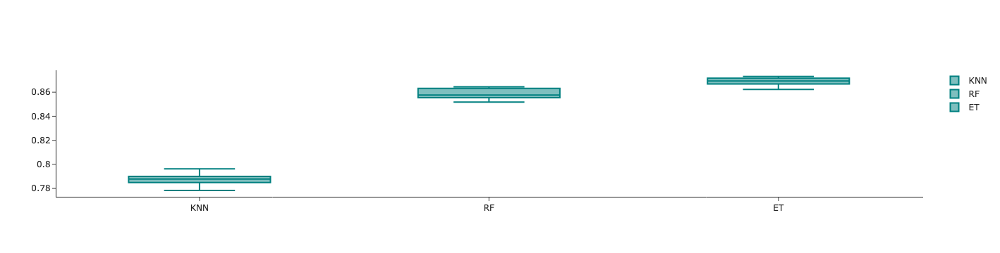

In [34]:
models = GetBaseModels()
names,results = ModelEvaluation(X_train_reduced, y_train,models)
PlotBox().PlotResult(names,results)

In [35]:
def ScoreDataFrame(names,results):
    def floatingDecimals(f_val, dec=3):
        prc = "{:."+str(dec)+"f}" 
    
        return float(prc.format(f_val))

    scores = []
    for r in results:
        scores.append(floatingDecimals(r.mean(),4))

    scoreDataFrame = pd.DataFrame({'Model':names, 'Score': scores})
    return scoreDataFrame

In [36]:
basedLineScore = ScoreDataFrame(names,results)
basedLineScore

,Model,Score
0,KNN,0.7879
1,RF,0.8585
2,ET,0.8688


# Transform the data

In [37]:
def GetScaledModel(nameOfScaler):
    
    if nameOfScaler == 'standard':
        scaler = StandardScaler()
    elif nameOfScaler =='minmax':
        scaler = MinMaxScaler()
    

    pipelines = []
    pipelines.append((nameOfScaler+'KNN' , Pipeline([('Scaler', scaler),('KNN' , KNeighborsClassifier())])))
    pipelines.append((nameOfScaler+'RF'  , Pipeline([('Scaler', scaler),('RF'  , RandomForestClassifier())])))
    pipelines.append((nameOfScaler+'ET'  , Pipeline([('Scaler', scaler),('ET'   , ExtraTreesClassifier())])))
    
    
    return pipelines 

# Evaluate models using scaled data

## StandardScaler

standardKNN: 0.837667 (0.005665)
standardRF: 0.858024 (0.005616)
standardET: 0.867580 (0.003095)


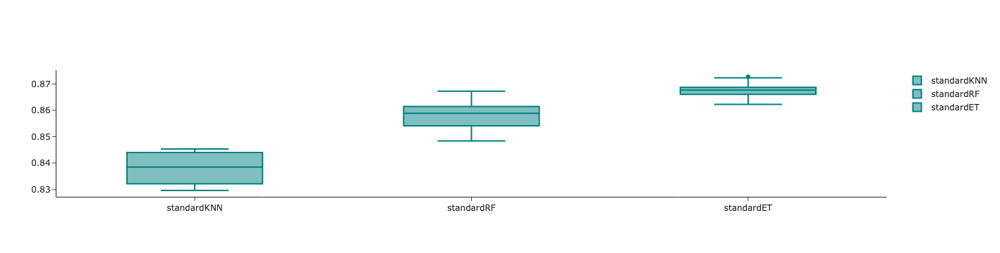

,Model,Score,Model,Score
0,KNN,0.7879,standardKNN,0.8377
1,RF,0.8585,standardRF,0.8580
2,ET,0.8688,standardET,0.8676


In [38]:
models = GetScaledModel('standard')
names,results = ModelEvaluation(X_train_reduced, y_train,models)
PlotBox().PlotResult(names,results)
scaledScoreStandard = ScoreDataFrame(names,results)
compareModels = pd.concat([basedLineScore,
                           scaledScoreStandard], axis=1)
compareModels

## MinMaxScaler

minmaxKNN: 0.838709 (0.005391)
minmaxRF: 0.859518 (0.004435)
minmaxET: 0.869541 (0.003024)


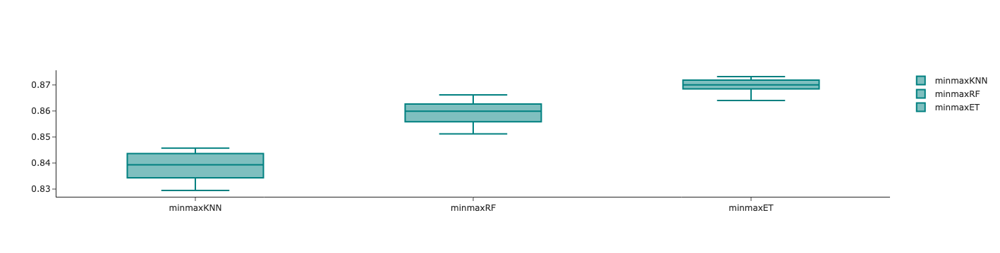

,Model,Score,Model,Score,Model,Score
0,KNN,0.7879,standardKNN,0.8377,minmaxKNN,0.8387
1,RF,0.8585,standardRF,0.8580,minmaxRF,0.8595
2,ET,0.8688,standardET,0.8676,minmaxET,0.8695


In [39]:
models = GetScaledModel('minmax')
names,results = ModelEvaluation(X_train_reduced, y_train,models)
PlotBox().PlotResult(names,results)

scaledScoreMinMax = ScoreDataFrame(names,results)
compareModels = pd.concat([basedLineScore,
                           scaledScoreStandard,
                          scaledScoreMinMax], axis=1)
compareModels

# Remove outliers

In [13]:
scaler = StandardScaler()
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train_reduced), columns=X_train_reduced.columns)
X_test_scaled = pd.DataFrame(scaler.transform(X_test_reduced), columns=X_test_reduced.columns)

In [14]:
X_train_scaled.head(3)

,Elevation,Wilderness_Area_3,Soil_Type_2,Soil_Type_3,Soil_Type_9,Soil_Type_37,Soil_Type_38,Hydro_Elevation_sum,Hydro_Elevation_diff,Hydro_Road_sum,Hydro_Road_diff,Hydro_Road_mean,Road_Fire_sum,Road_Fire_mean,Hydro_Road_Fire_mean
0,0.091585,-0.258694,-0.096096,-0.151717,-0.245742,-0.162251,-0.15914,0.209570,-0.034822,1.326335,1.326335,1.326335,2.098204,2.098204,2.089013
1,1.032260,-0.258694,-0.096096,-0.151717,-0.245742,-0.162251,-0.15914,0.815697,1.213479,0.303004,0.303004,0.303004,-0.315046,-0.315046,-0.399949
2,0.708013,-0.258694,-0.096096,-0.151717,-0.245742,-0.162251,-0.15914,0.521195,0.872063,1.328222,1.328222,1.328222,0.750561,0.750561,0.629226


In [15]:
X_train_scaled.reset_index(drop=True, inplace=True)
X_train_scaled_names = X_train_scaled.columns
y_train.reset_index(drop=True, inplace=True)
X_test_scaled.reset_index(drop=True, inplace=True)
y_test.reset_index(drop=True, inplace=True)
train_df = pd.concat([X_train_scaled, y_train], axis=1)
test_df = pd.concat([X_test_scaled, y_test], axis=1)

In [45]:
train_df_outliers_removed = train_df[~train_df['target'] <= 3.0]
test_df_outliers_removed = test_df[~test_df['target'] <= 3.0]

Apparently there are no outliers

# Use GridSearch to see if we can improve model by hyperparameter-tuning

In [14]:
class GridSearch(object):
    
    def __init__(self,X_train,y_train,model,hyperparameters):
        
        self.X_train = X_train
        self.y_train = y_train
        self.model = model
        self.hyperparameters = hyperparameters
        
    def GridSearch(self):
        
        cv = 10
        clf = GridSearchCV(self.model,
                                 self.hyperparameters,
                                 cv=cv,
                                 verbose=0,
                                 n_jobs=-1,
                                 )
        # Fit randomized search
        best_model = clf.fit(self.X_train, self.y_train)
        message = (best_model.best_score_, best_model.best_params_)
        print("Best: %f using %s" % (message))

        return best_model,best_model.best_params_
    
    def BestModelPredict(self,X_train):
        
        best_model,_ = self.GridSearch()
        pred = best_model.predict(X_train)
        return pred

In [15]:
def floatingDecimals(f_val, dec=3):
        prc = "{:."+str(dec)+"f}" #first cast decimal as str
    #     print(prc) #str format output is {:.3f}
        return float(prc.format(f_val))

## KNearest Neighbours

https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html

n_neighbors: Number of neighbors to use by default for k_neighbors queries

In [50]:
model_KNN = KNeighborsClassifier()

neighbors = [1,3,5,7,9,11,13,15,17,19]
param_grid = dict(n_neighbors=neighbors)

In [51]:
KNN_GridSearch = GridSearch(X_train_scaled,y_train,model_KNN,param_grid)
Prediction_KNN = KNN_GridSearch.BestModelPredict(X_train_scaled)

Best: 0.865550 using {'n_neighbors': 1}


## Random Forest Classifier

https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html

n_estimators = The number of trees in the forest

criterion = The function to measure the quality of a split. Supported criteria are “gini” for the Gini impurity and “log_loss” and “entropy” both for the Shannon information gain, see Mathematical formulation. Note: This parameter is tree-specific

In [17]:
n_estimators_value = [50,100,150,200,250,300]
criterion = ['gini', 'entropy', 'log_loss']

param_grid = dict(n_estimators=n_estimators_value, criterion=criterion)
model_RF = RandomForestClassifier()

In [18]:
RF_GridSearch = GridSearch(X_train_scaled,y_train,model_RF,param_grid)
Prediction_RF = RF_GridSearch.BestModelPredict(X_train_scaled)

Best: 0.863375 using {'criterion': 'entropy', 'n_estimators': 300}


## Extra Trees Classifier

https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.ExtraTreesClassifier.html#:~:text=An%20extra%2Dtrees%20classifier.,accuracy%20and%20control%20over%2Dfitting.

similar to above


In [19]:
n_estimators_value = [50,100,150,200,250,300]
criterion = ['gini', 'entropy', 'log_loss']

param_grid = dict(n_estimators=n_estimators_value, criterion=criterion)
model_ET = ExtraTreesClassifier()

In [20]:
ET_GridSearch = GridSearch(X_train_scaled,y_train,model_ET,param_grid)
Prediction_ET = ET_GridSearch.BestModelPredict(X_train_scaled)

Best: 0.871825 using {'criterion': 'gini', 'n_estimators': 300}


In [ ]:
import shap
kfold = StratifiedKFold(n_splits=10, random_state=SEED, shuffle = True)

list_shap_values = list()
list_test_sets = list()
for train_index, test_index in kfold.split(X_train_scaled, y_train):
    X_train_scaled, X_val_scaled = X_train_scaled.iloc[train_index], X_train_scaled.iloc[test_index]
    y_train, y_val_test = y_train.iloc[train_index], y_train.iloc[test_index]
    X_train_scaled = pd.DataFrame(X_train_scaled,columns=X_train_scaled_names)
    X_val_scaled = pd.DataFrame(X_val_scaled,columns=X_train_scaled_names)

    #training model
    clf = ExtraTreesClassifier(criterion = 'gini', n_estimators = 300, random_state=SEED, n_jobs = -1)
    clf.fit(X_train_scaled, y_train)

    #explaining model
    explainer = shap.TreeExplainer(clf)
    shap_values = explainer.shap_values(X_val_scaled)
    #for each iteration we save the val_set index and the shap_values
    list_shap_values.append(shap_values)


'''# flatten list of lists and create df with the average values from each class for each feature
shap_values_av = np.vstack([sv[0] for sv in list_shap_values])
shap_values_av = np.vstack([sv[1] for sv in list_shap_values])
shap_values_av = np.vstack([sv[2] for sv in list_shap_values])
shap_values_av = np.vstack([sv[3] for sv in list_shap_values])
shap_values_av = np.vstack([sv[4] for sv in list_shap_values])
shap_values_av = np.vstack([sv[5] for sv in list_shap_values])
shap_values_av = np.vstack([sv[6] for sv in list_shap_values])
sv_0 = np.abs(shap_values_av).mean(0) 
sv_1 = np.abs(shap_values_av).mean(1) 
sv_2 = np.abs(shap_values_av).mean(2) 
sv_3 = np.abs(shap_values_av).mean(3) 
sv_4 = np.abs(shap_values_av).mean(4) 
sv_5 = np.abs(shap_values_av).mean(5) 
sv_6 = np.abs(shap_values_av).mean(6) 

importance_df = pd.DataFrame({
    "column_name": X_train_scaled_names,
    "shap_values_av_0": sv_0,
    "shap_values_av_1": sv_1,
    "shap_values_av_2": sv_2,
    "shap_values_av_3": sv_3,
    "shap_values_av_4": sv_4,
    "shap_values_av_5": sv_5,
    "shap_values_av_6": sv_6,
})'''

In [ ]:
importance_df(7)

## Voting ensemble Classifier

https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.VotingClassifier.html

In [12]:
param = {'n_neighbors': 1}
model1 = KNeighborsClassifier(**param)

param = {'criterion': 'entropy', 'n_estimators': 300}
model2 = RandomForestClassifier(**param)

param = {'criterion': 'gini', 'n_estimators': 300}
model3 = ExtraTreesClassifier(**param)

# create the sub models
estimators = [('KNN',model1), ('RF',model2), ('ET',model3)]

# create the ensemble model
kfold = StratifiedKFold(n_splits=10, random_state=SEED, shuffle = True)
ensemble = VotingClassifier(estimators)
results = cross_val_score(ensemble, X_train_scaled, y_train, cv=kfold)
print('F1 weighted score on train: ',results.mean())
ensemble_model = ensemble.fit(X_train_scaled,y_train)
pred = ensemble_model.predict(X_test_scaled)
print('F1 weighted score on test:' , (y_test == pred).mean())

F1 weighted score on train:  0.874225
F1 weighted score on test: 0.8827


TARGET VARIABLE
* 1: Spruce/Fir
* 2: Lodgepole Pine
* 3: Ponderosa Pine
* 4: Cottonwood/Willow
* 5: Aspen
* 6: Douglas-fir
* 7: Krummholz

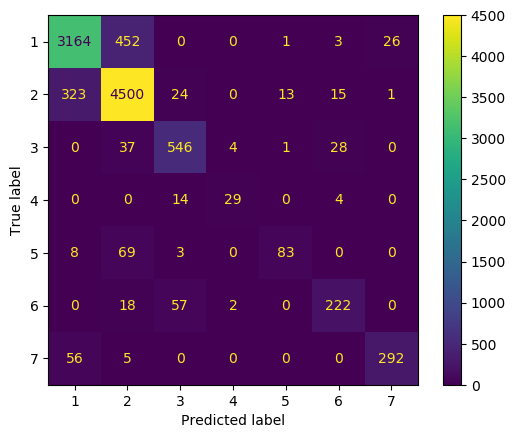

In [44]:
from sklearn.metrics import plot_confusion_matrix
cfm_raw = plot_confusion_matrix(ensemble_model, X_test_scaled, y_test, values_format = '')
plt.savefig("cfm_raw.png")

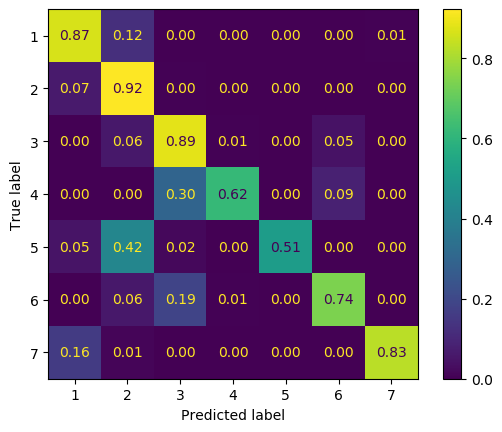

In [45]:
from sklearn.metrics import plot_confusion_matrix
cfm_precision = plot_confusion_matrix(ensemble_model, X_test_scaled, y_test, values_format = '.2f', normalize = 'true') # True = normalize along rows (PRECISION)
plt.savefig("cfm_precision.png")

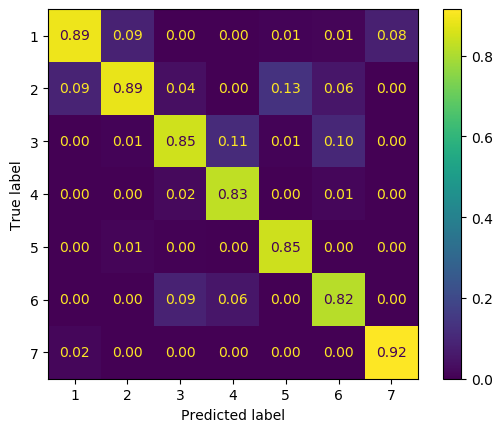

In [46]:
from sklearn.metrics import plot_confusion_matrix
cfm_recall = plot_confusion_matrix(ensemble_model, X_test_scaled, y_test, values_format = '.2f', normalize = 'pred') # pred = normalize along columns (RECALL)
plt.savefig("cfm_recall.png")

# Error analysis

In [14]:
# add predicted values test_df to compare with ground truth
test_df['predicted'] = pred

# create class 0 = no error , 1 = error
test_df['error'] = (test_df['target']!=test_df['predicted']).astype(int)
test_df_names = test_df.columns

test_df.head()

,Elevation,Wilderness_Area_3,Soil_Type_2,Soil_Type_3,Soil_Type_9,Soil_Type_37,Soil_Type_38,Hydro_Elevation_sum,Hydro_Elevation_diff,Hydro_Road_sum,Hydro_Road_diff,Hydro_Road_mean,Road_Fire_sum,Road_Fire_mean,Hydro_Road_Fire_mean,target,predicted,error
0,-0.229099,-0.258694,-0.096096,-0.151717,-0.245742,-0.162251,-0.15914,-0.345191,-0.098838,-0.644222,-0.644222,-0.644222,-0.685138,-0.685138,-0.778786,2,2,0
1,0.665255,-0.258694,-0.096096,-0.151717,-0.245742,-0.162251,-0.15914,0.507497,0.800935,1.563456,1.563456,1.563456,0.803735,0.803735,0.694470,1,1,0
2,-0.596105,-0.258694,-0.096096,-0.151717,-0.245742,-0.162251,-0.15914,-0.680787,-0.482930,-0.079409,-0.079409,-0.079409,0.230306,0.230306,0.194405,2,1,1
3,-0.817021,-0.258694,-0.096096,-0.151717,-0.245742,-0.162251,-0.15914,-0.858858,-0.738992,-1.377599,-1.377599,-1.377599,-0.634091,-0.634091,-0.690391,2,2,0
4,-0.300363,-0.258694,-0.096096,-0.151717,-0.245742,-0.162251,-0.15914,-0.060962,-0.536276,-1.066260,-1.066260,-1.066260,-1.404476,-1.404476,-1.310842,1,2,1


In [20]:
test_df['error'].value_counts()

0    8827
1    1173
Name: error, dtype: int64

## Visualize data

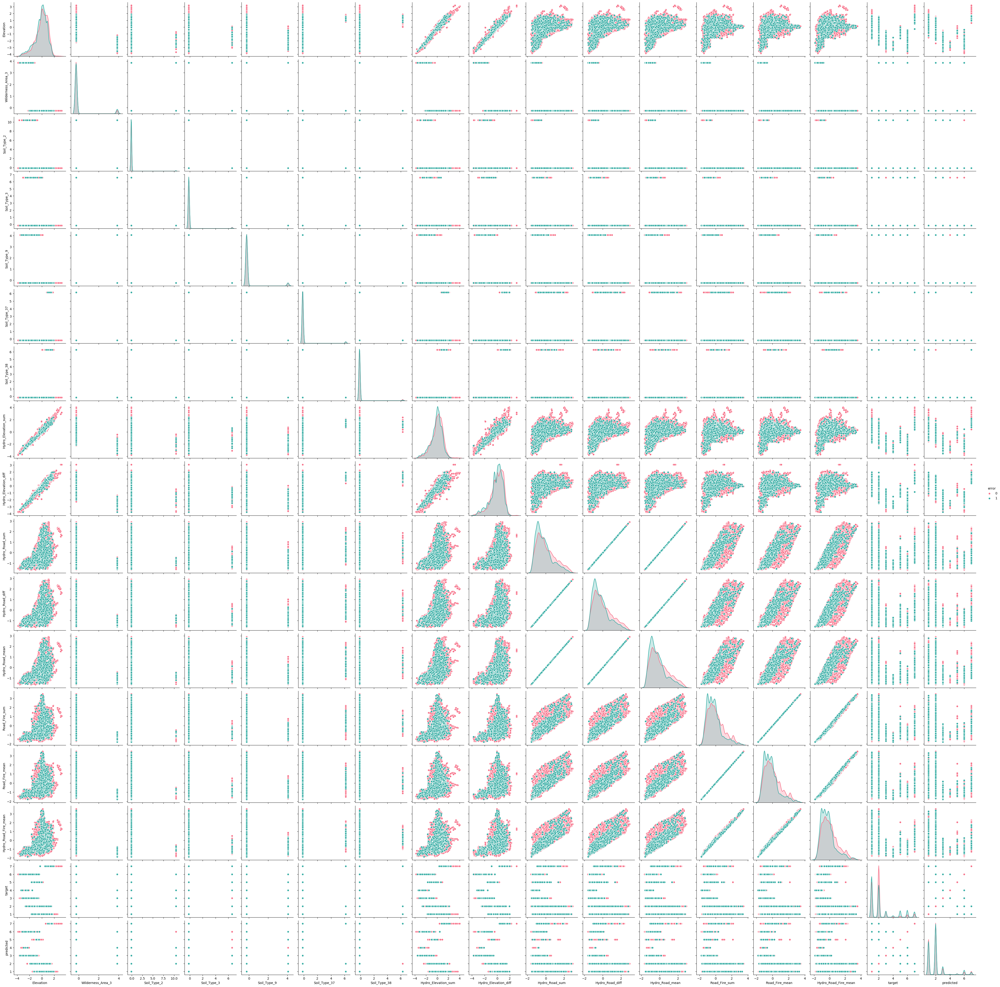

In [31]:
 g = sns.pairplot(test_df, hue="error", palette="husl", diag_kws={'bw':0.1})

In [33]:
from scipy.stats import skew
from scipy.stats import kurtosis


def plotHist(df,feature,target):        
    
    x0 = df[df[target]==0][feature]
    x1 = df[df[target]==1][feature]
   

    trace1 = go.Histogram(
        x=x0,
        marker_color='#0093FF',
        opacity=0.75
    )
    trace2 = go.Histogram(
        x=x1,
        marker_color='#E08AF4',
        opacity=0.75
    )
    

    data = [trace1, trace2]
    layout = go.Layout(barmode='overlay',
                      title=feature,
                       yaxis=dict(title='Count'
        ))
    fig = go.Figure(data=data, layout=layout)
    fig.update_layout(template='simple_white')

    py.iplot(fig, filename='overlaid histogram')
    
    def DescribeFloatSkewKurt(df,target):
        """
            A fundamental task in many statistical analyses is to characterize
            the location and variability of a data set. A further
            characterization of the data includes skewness and kurtosis.
            Skewness is a measure of symmetry, or more precisely, the lack
            of symmetry. A distribution, or data set, is symmetric if it
            looks the same to the left and right of the center point.
            Kurtosis is a measure of whether the data are heavy-tailed
            or light-tailed relative to a normal distribution. That is,
            data sets with high kurtosis tend to have heavy tails, or
            outliers. Data sets with low kurtosis tend to have light
            tails, or lack of outliers. A uniform distribution would
            be the extreme case (see ref below)
        """
        print('-*-'*25)
        print("{0} mean : ".format(target), np.mean(df[feature]))
        print("{0} var : ".format(target), np.var(df[feature]))
        print("{0} skew : ".format(target), skew(df[feature]))
        print("{0} kurt : ".format(target), kurtosis(df[feature]))
        print('-*-'*25)
    
    DescribeFloatSkewKurt(df,target)
    
# reference https://www.itl.nist.gov/div898/handbook/eda/section3/eda35b.htm#:~:text=Skewness%20is%20a%20measure%20of,relative%20to%20a%20normal%20distribution.

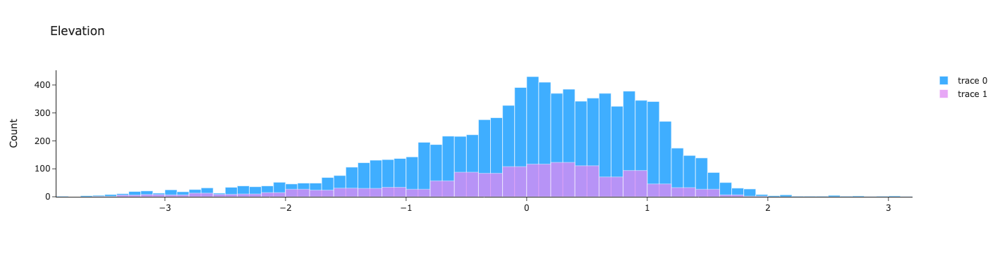

-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-
error mean :  -0.0001415466555670224
error var :  1.0003958420682815
error skew :  -0.8028492135814754
error kurt :  0.7399368450761488
-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-


In [35]:
plotHist(test_df,test_df_names[0],'error')

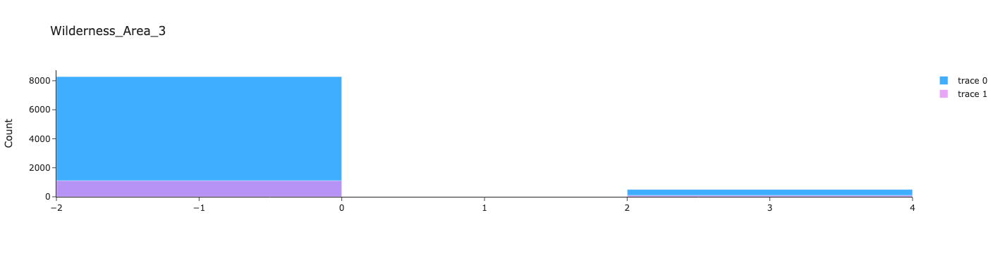

-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-
error mean :  -0.009588906979516115
error var :  0.9653220878233025
error skew :  3.690606191969899
error kurt :  11.620574064206554
-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-


In [36]:
plotHist(test_df,test_df_names[1],'error')

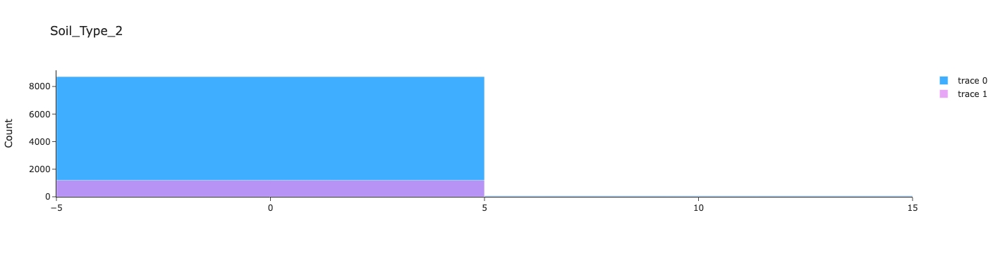

-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-
error mean :  -0.008926977123135059
error var :  0.9078819835374238
error skew :  10.83929412726751
error kurt :  115.49029717741585
-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-


In [37]:
plotHist(test_df,test_df_names[2],'error')

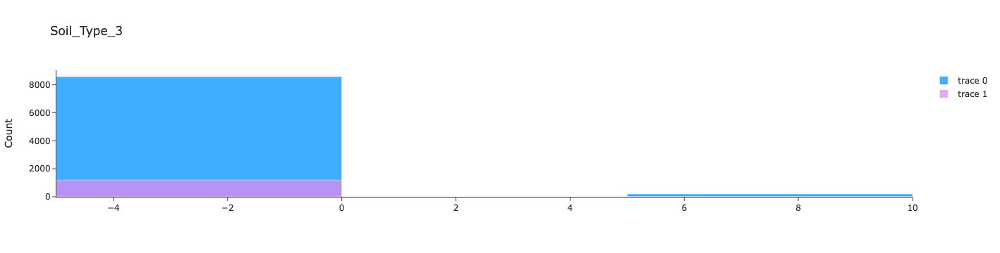

-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-
error mean :  0.001348591299797515
error var :  1.0086824666096903
error skew :  6.4090631682717465
error kurt :  39.076090694897516
-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-


In [38]:
plotHist(test_df,test_df_names[3],'error')

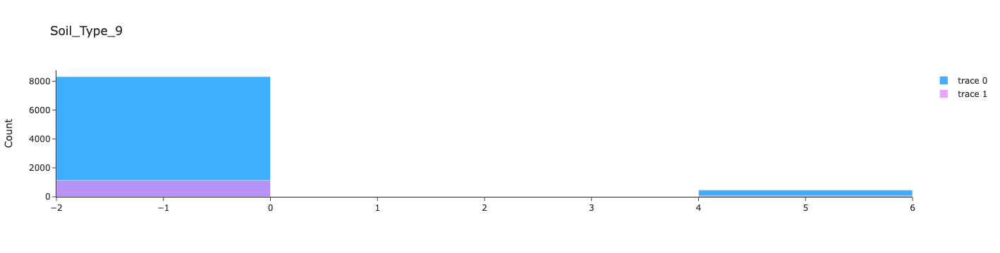

-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-
error mean :  -0.013592405737517632
error var :  0.9478437954596307
error skew :  3.9552774377789177
error kurt :  13.644219609802946
-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-


In [39]:
plotHist(test_df,test_df_names[4],'error')

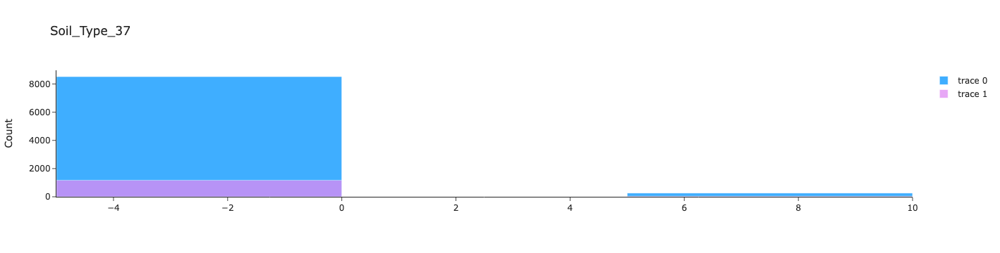

-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-
error mean :  0.028781287463887174
error var :  1.1718897718685857
error skew :  5.4903299739437355
error kurt :  28.143723222785038
-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-


In [40]:
plotHist(test_df,test_df_names[5],'error')

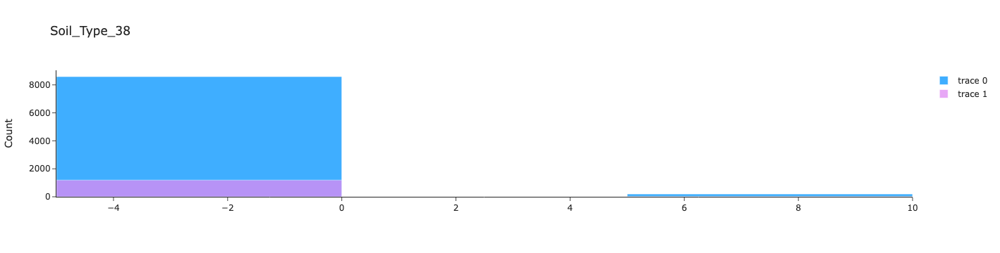

-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-
error mean :  -0.021261619961779263
error var :  0.8693282789350127
error skew :  6.6144417706465966
error kurt :  41.750839937274485
-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-


In [41]:
plotHist(test_df,test_df_names[6],'error')

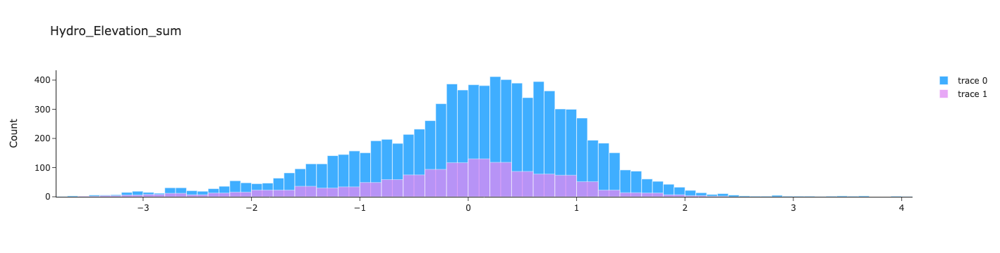

-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-
error mean :  0.0013599338539602216
error var :  1.009371771429338
error skew :  -0.5555835226786959
error kurt :  0.6569389184562926
-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-


In [42]:
plotHist(test_df,test_df_names[7],'error')

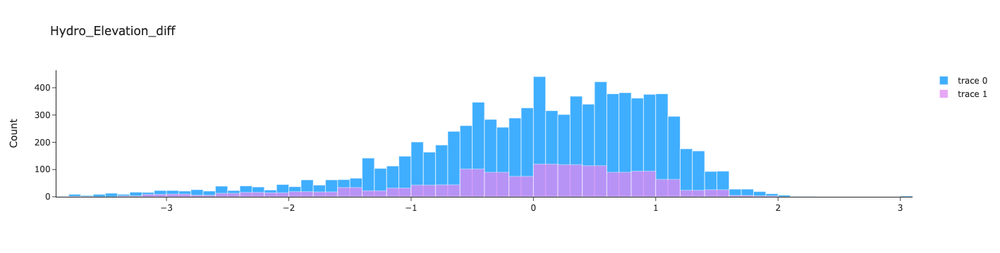

-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-
error mean :  -0.001694897697222212
error var :  0.9936499360635287
error skew :  -0.8989074774982365
error kurt :  0.8765440514224223
-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-


In [43]:
plotHist(test_df,test_df_names[8],'error')

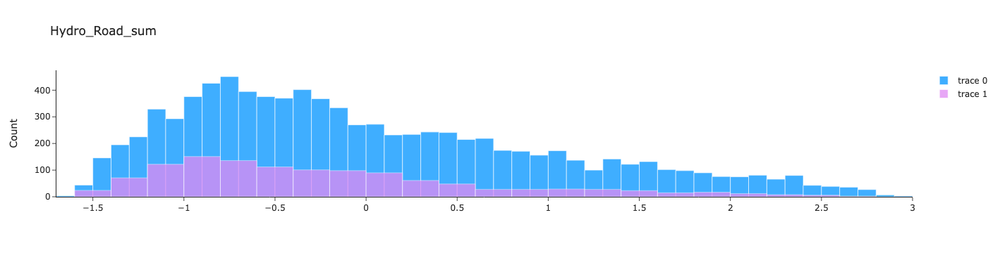

-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-
error mean :  -0.0025121149970293833
error var :  0.9871504109135287
error skew :  0.7354974374854685
error kurt :  -0.2412045131847531
-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-


In [44]:
plotHist(test_df,test_df_names[9],'error')

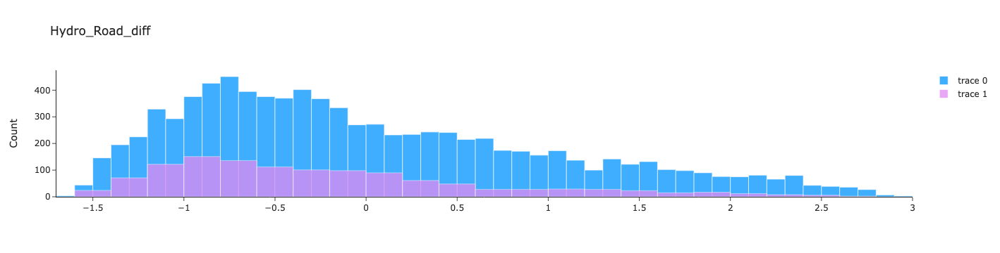

-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-
error mean :  -0.0025121149970293833
error var :  0.9871504109135287
error skew :  0.7354974374854685
error kurt :  -0.2412045131847531
-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-


In [45]:
plotHist(test_df,test_df_names[10],'error')

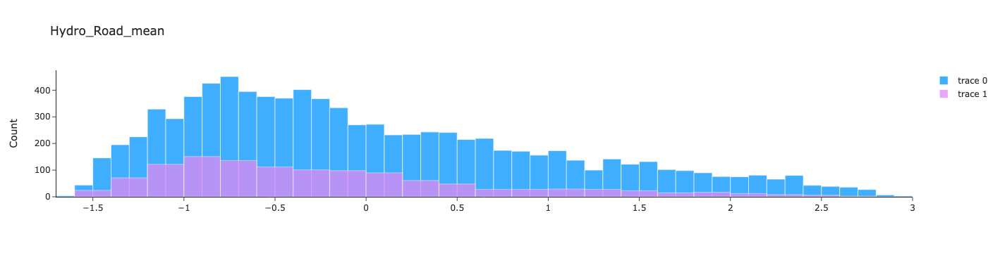

-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-
error mean :  -0.0025121149970293833
error var :  0.9871504109135287
error skew :  0.7354974374854685
error kurt :  -0.2412045131847531
-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-


In [46]:
plotHist(test_df,test_df_names[11],'error')

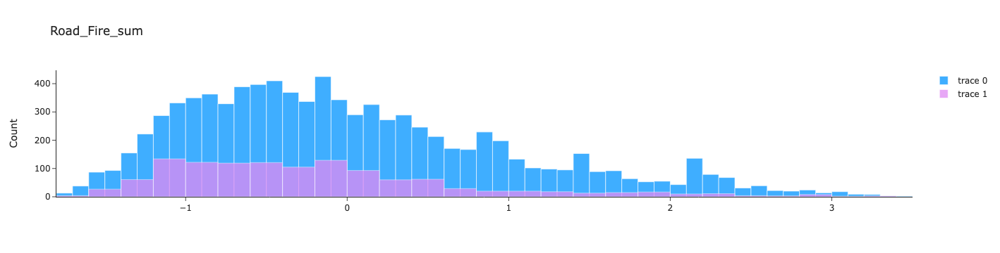

-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-
error mean :  0.005026104750644331
error var :  0.9857673220918929
error skew :  0.8251901659188389
error kurt :  0.23233854539245247
-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-


In [47]:
plotHist(test_df,test_df_names[12],'error')

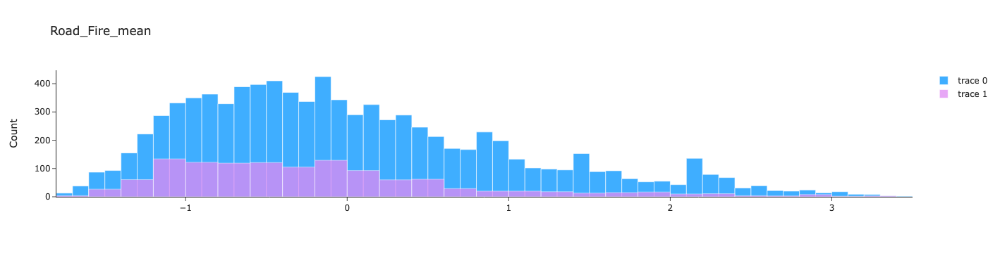

-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-
error mean :  0.005026104750644331
error var :  0.9857673220918929
error skew :  0.8251901659188389
error kurt :  0.23233854539245247
-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-


In [48]:
plotHist(test_df,test_df_names[13],'error')

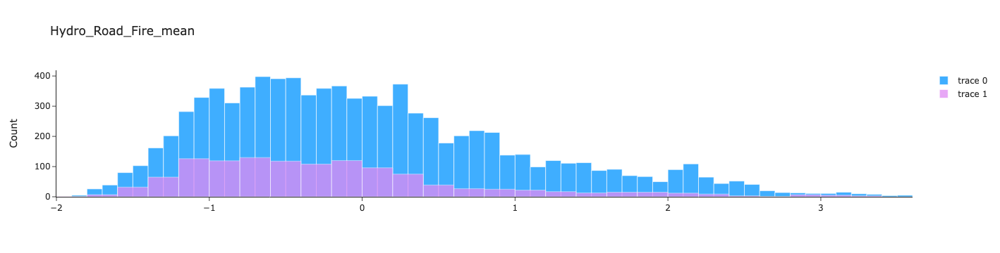

-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-
error mean :  0.005187578290385204
error var :  0.9883207477775264
error skew :  0.8173706439883518
error kurt :  0.29151758353803947
-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-


In [49]:
plotHist(test_df,test_df_names[14],'error')

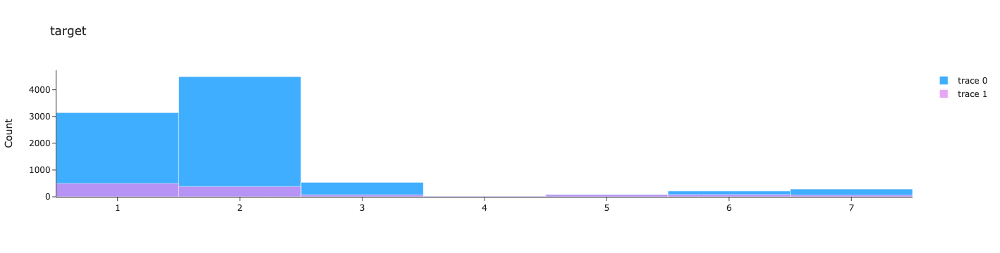

-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-
error mean :  2.0514
error var :  1.949958040000006
error skew :  2.276944455976869
error kurt :  4.951155258795559
-*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*--*-


In [50]:
plotHist(test_df,test_df_names[15],'error')

## Classifying errors

In [15]:
X_error = test_df[['Elevation', 'Wilderness_Area_3', 'Soil_Type_2', 'Soil_Type_3', 'Soil_Type_9', 'Soil_Type_37', 'Soil_Type_38',
                       'Hydro_Elevation_sum', 'Hydro_Elevation_diff', 'Hydro_Road_sum', 'Hydro_Road_diff', 'Hydro_Road_mean', 'Road_Fire_sum',
                       'Road_Fire_mean', 'Hydro_Road_Fire_mean']]

X_error_names = X_error.columns
y_error = test_df['error']

In [16]:
y_error.to_frame()

,error
0,0
1,0
2,1
3,0
4,1
...,...
9995,0
9996,0
9997,0
9998,0


In [17]:
X_error.reset_index(inplace = True)
X_error.head()

,index,Elevation,Wilderness_Area_3,Soil_Type_2,Soil_Type_3,Soil_Type_9,Soil_Type_37,Soil_Type_38,Hydro_Elevation_sum,Hydro_Elevation_diff,Hydro_Road_sum,Hydro_Road_diff,Hydro_Road_mean,Road_Fire_sum,Road_Fire_mean,Hydro_Road_Fire_mean
0,0,-0.229099,-0.258694,-0.096096,-0.151717,-0.245742,-0.162251,-0.15914,-0.345191,-0.098838,-0.644222,-0.644222,-0.644222,-0.685138,-0.685138,-0.778786
1,1,0.665255,-0.258694,-0.096096,-0.151717,-0.245742,-0.162251,-0.15914,0.507497,0.800935,1.563456,1.563456,1.563456,0.803735,0.803735,0.694470
2,2,-0.596105,-0.258694,-0.096096,-0.151717,-0.245742,-0.162251,-0.15914,-0.680787,-0.482930,-0.079409,-0.079409,-0.079409,0.230306,0.230306,0.194405
3,3,-0.817021,-0.258694,-0.096096,-0.151717,-0.245742,-0.162251,-0.15914,-0.858858,-0.738992,-1.377599,-1.377599,-1.377599,-0.634091,-0.634091,-0.690391
4,4,-0.300363,-0.258694,-0.096096,-0.151717,-0.245742,-0.162251,-0.15914,-0.060962,-0.536276,-1.066260,-1.066260,-1.066260,-1.404476,-1.404476,-1.310842


In [20]:
import shap
kfold = KFold(n_splits=10, random_state=SEED, shuffle = True)

list_shap_values = list()
list_test_sets = list()
for train_index, test_index in kfold.split(X_error):
    X_error_train, X_error_test = X_error.iloc[train_index], X_error.iloc[test_index]
    y_error_train, y_error_test = y_error.iloc[train_index], y_error.iloc[test_index]
    X_error_train = pd.DataFrame(X_error_train,columns=X_error_names)
    X_error_test = pd.DataFrame(X_error_test,columns=X_error_names)

    #training model
    clf = RandomForestClassifier(criterion = 'entropy', n_estimators = 300, random_state=SEED)
    clf.fit(X_error_train, y_error_train)

    #explaining model
    explainer = shap.TreeExplainer(clf)
    shap_values = explainer.shap_values(X_error_test)
    #for each iteration we save the test_set index and the shap_values
    list_shap_values.append(shap_values)


# flatten list of lists, pick the sv for 1 class, stack the result (you only need to look at 1 class for binary classification since values will be opposite to one another)
shap_values_av = np.vstack([sv[1] for sv in list_shap_values])
sv = np.abs(shap_values_av).mean(0) 
sv_std = np.abs(shap_values_av).std(0) 
sv_max = np.abs(shap_values_av).max(0) 
importance_df = pd.DataFrame({
    "column_name": X_error_names,
    "shap_values_av": sv,
    "shap_values_std": sv_std,
    "shap_values_max": sv_max
})

In [26]:
importance_df

,column_name,shap_values_av,shap_values_std,shap_values_max
0,Elevation,0.012107,0.011316,0.091176
1,Wilderness_Area_3,0.000600,0.001644,0.028102
2,Soil_Type_2,0.000277,0.001453,0.055769
3,Soil_Type_3,0.001086,0.003758,0.085181
4,Soil_Type_9,0.001699,0.004163,0.048393
5,Soil_Type_37,0.000811,0.002571,0.067202
6,Soil_Type_38,0.000399,0.001344,0.029261
7,Hydro_Elevation_sum,0.012894,0.011144,0.115344
8,Hydro_Elevation_diff,0.014527,0.012067,0.088443
9,Hydro_Road_sum,0.010450,0.009296,0.089517


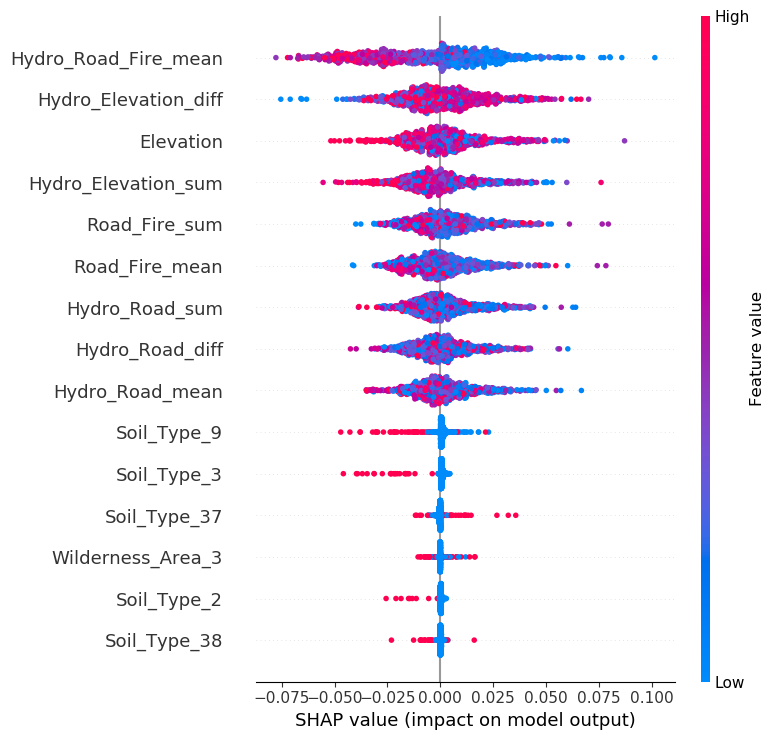

In [21]:
shap.summary_plot(shap_values[1], X_error_test, feature_names=X_error_names, show=False)
#shap.summary_plot(shap_values, X_train,max_display=10,show=False)
plt.savefig("shap_summary.png",dpi=700) 
plt.show()

# Upsampling using ADASYN

https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.ADASYN.html

Oversample using Adaptive Synthetic (ADASYN) algorithm.

This method is similar to SMOTE but it generates different number of samples depending on an estimate of the local distribution of the class to be oversampled.

In [2]:
!pip install imblearn # have to restart kernel after installing

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.0/226.0 kB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.8/24.8 MB 192.5 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 0.22.1
    Uninstalling scikit-learn-0.22.1:
      Successfully uninstalled scikit-learn-0.22.1

[notice] A new release of pip is available: 23.0 -> 23.0.1
[notice] To update, run: pip install --upgrade pip


In [13]:
import imblearn
from imblearn.over_sampling import ADASYN

X_train_adasyn, y_train_adasyn = ADASYN().fit_resample(X_train_scaled, y_train)

In [14]:
# create the ensemble model
kfold = StratifiedKFold(n_splits=10, random_state=SEED, shuffle = True)
ensemble = VotingClassifier(estimators)
results = cross_val_score(ensemble, X_train_adasyn,y_train_adasyn, cv=kfold, n_jobs = -1)
print('F1 weighted score on train: ',results.mean())
ensemble_model = ensemble.fit(X_train_adasyn,y_train_adasyn)
pred = ensemble_model.predict(X_test_scaled)
print('F1 weighted score on test:' , (y_test == pred).mean())

F1 weighted score on train:  0.9658444376988922
F1 weighted score on test: 0.8701


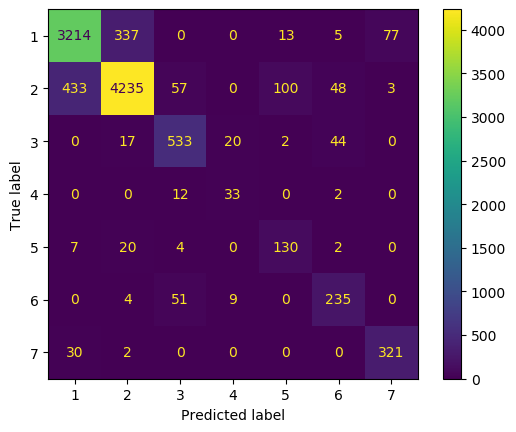

In [16]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(ensemble_model, X_test_scaled, y_test, values_format = '')

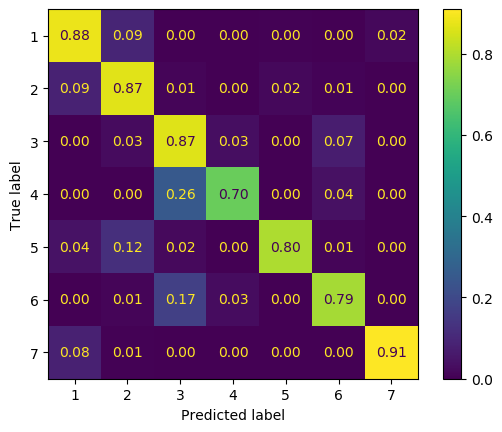

In [17]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(ensemble_model, X_test_scaled, y_test, values_format = '.2f', normalize = 'true')

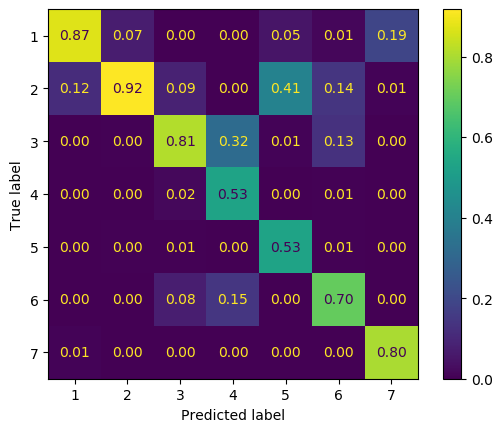

In [18]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(ensemble_model, X_test_scaled, y_test, values_format = '.2f', normalize = 'pred')